# DBSCAN

In [1]:
import numpy as np
import sys
sys.path.append("..")
from function.function import loadData, show_data, preprocessing, showDistribution, removenans, crossplot, dbscan, plotResult
from function.function import dbscan_param, plot_dimensionality_reduction,crossplot_result, plot_cluster_distribution
from function.function import calculateAri, calculateAmi, calculateVm, input_deleteNan, plotInputData

## Load Data

In [2]:
data = np.load('../syntheticData/Model5b/output_fields_smooth.npz')

data_list = loadData(data)

## Plot Input Data

Using function show_data() to draw each parameter of input data. 

There are three parameters of show_data(), which are dataset, the number of rows and the number of columns.

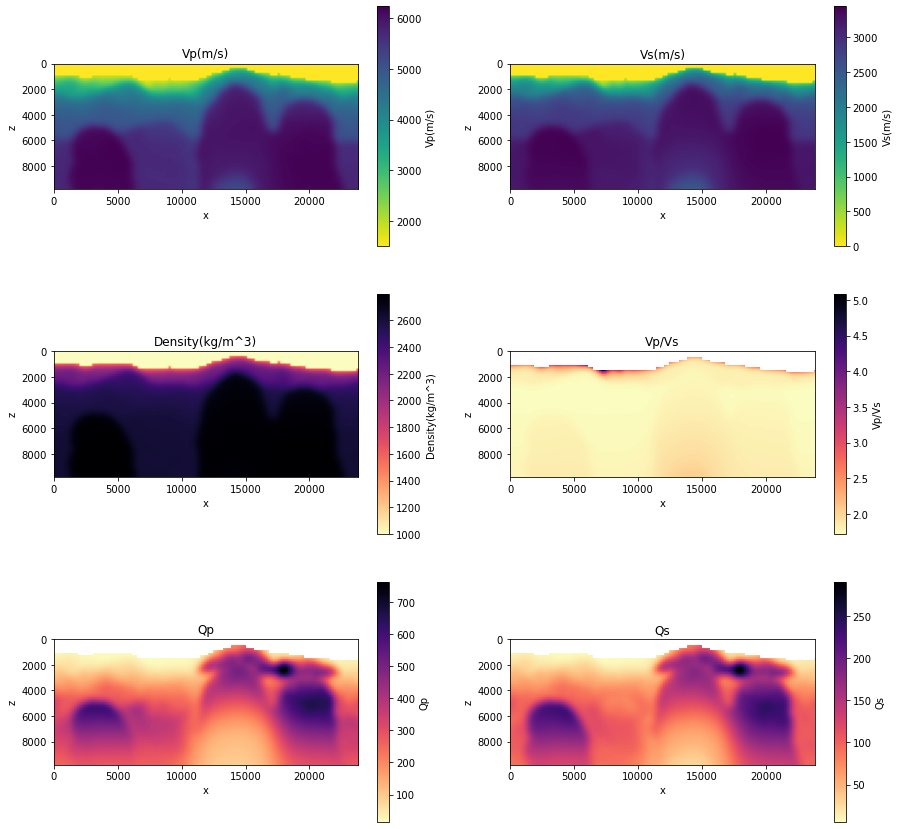

In [3]:
show_data(data_list,3,2)

Using removenans() to remove points with nan values from array. 

- new_data is the original data saved in the form of np.array.

- data_noNan removes nan values from new_data. 

- nan_list is the list of nan values index.

In [4]:
new_data,data_noNan,nan_list = removenans(data)

Using showDistribution() to show the distribution of each parameter. Since the last two parameters of new_data is 'x' and 'z', we only use new_data[:,:-2]

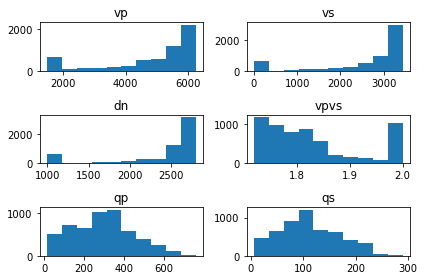

In [5]:
showDistribution(new_data[:,:-2])

Using crossplot to plot the cross-plot (scatter plot) of each pair of physical properties (other parameters and vp)

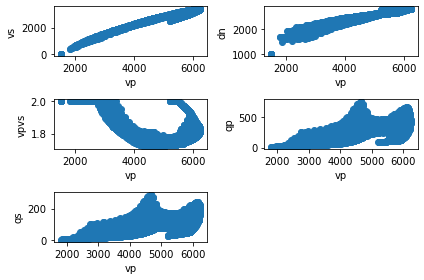

In [6]:
crossplot(new_data)

## Data Preprocessing

Using preprocessing() to make data standardized

In [7]:
# remove the mean
# divide by the variance

data_preprocessing = preprocessing(data_noNan) 


## Plot Data after Preprocessing

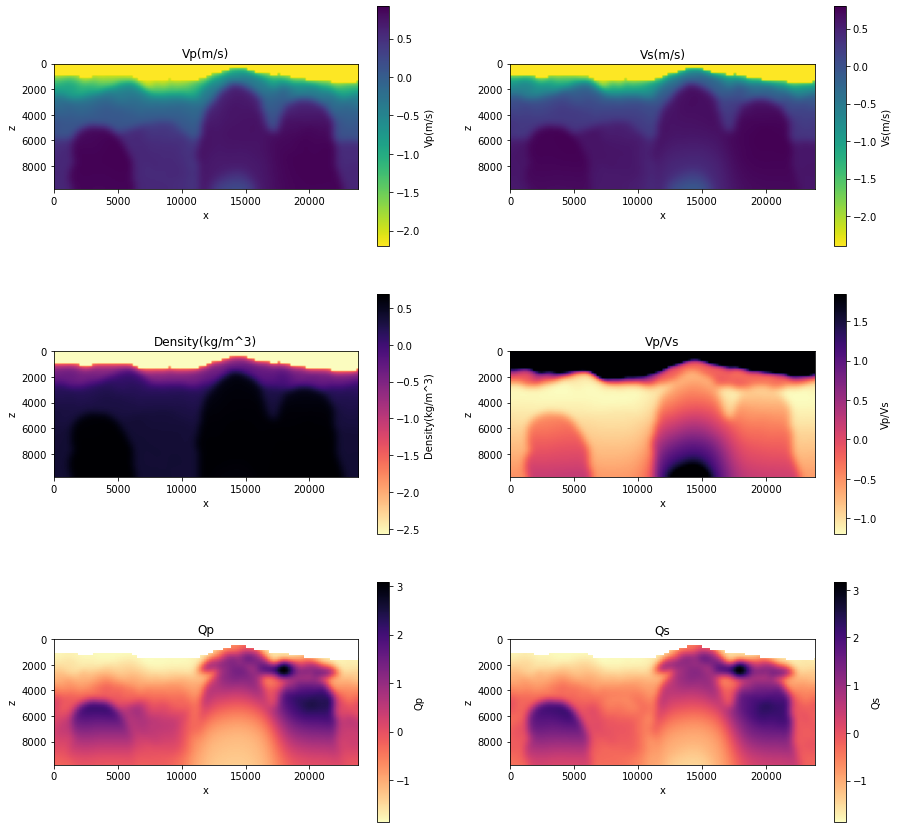

In [8]:
data_list = []
data1 = preprocessing(new_data)
for i in range(data_preprocessing.shape[1]-2):
    data_list.append(data1[:,i].reshape(50,120))
show_data(data_list,3,2)

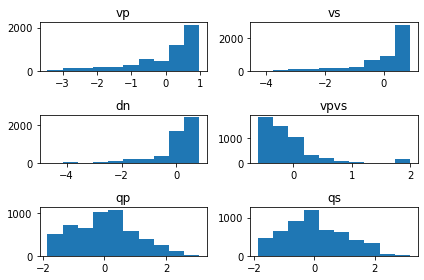

In [9]:
showDistribution(data_preprocessing[:,:-2])

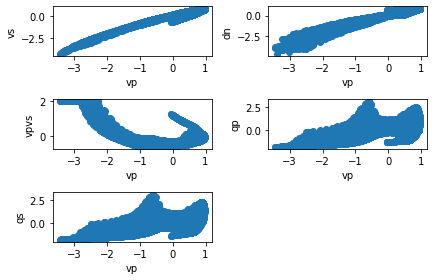

In [10]:
crossplot(data_preprocessing)

## Input Data

Loading and plotting input data.

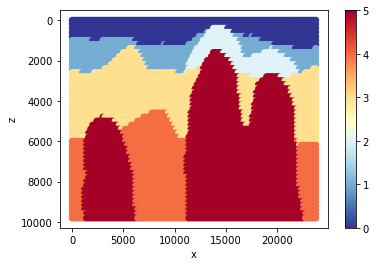

In [11]:
input_data = np.load('../syntheticData/Model5b/input_fields.npz')
plotInputData(input_data)

In [12]:
input_label = input_data['classes'].reshape(-1)
input_label = input_deleteNan(input_label, nan_list)

## DBSCAN

Using dbscan() to divide data in clusters.

- result_db is the result of dbscan and data_preprocessing is normalized data with no nan value

Using plotResult() to show the result of clusters.

- data is the original input data
- result_db is labels for data without nan values after DBSCAN

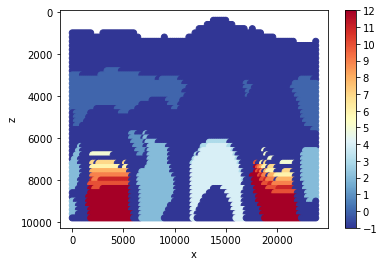

In [13]:
result_db = dbscan(data_preprocessing[:,:-2],eps=0.05,min_sample=20)
plotResult(data_noNan,result_db)

## Tuning Parameters

Using hdbscan_param() to tuning HDBSCAN parameters

In [14]:
dbscan_param(data_preprocessing[:,:-2])

Running grid search over hyperparameters
CH score: 23.427493221134092, eps: 0.05, min_sample_size: 2
CH score: 37.45688580539465, eps: 0.05, min_sample_size: 3
CH score: 63.08443344048331, eps: 0.05, min_sample_size: 4
CH score: 64.475909882469, eps: 0.05, min_sample_size: 7
CH score: 74.3423418196664, eps: 0.05, min_sample_size: 8
CH score: 80.64611896848083, eps: 0.05, min_sample_size: 9
CH score: 87.66275139013868, eps: 0.05, min_sample_size: 13
CH score: 88.86121271851877, eps: 0.05, min_sample_size: 14
CH score: 94.47107684654921, eps: 0.05, min_sample_size: 15
CH score: 98.76028921208146, eps: 0.05, min_sample_size: 16
CH score: 102.00947920703256, eps: 0.060000000000000005, min_sample_size: 9
CH score: 120.87958891922182, eps: 0.060000000000000005, min_sample_size: 10
CH score: 140.4463830787806, eps: 0.060000000000000005, min_sample_size: 17
CH score: 170.89515293796163, eps: 0.060000000000000005, min_sample_size: 18
CH score: 218.4411672298838, eps: 0.07, min_sample_size: 14
C

Plotting result of best parameters.
dbscan() have three parameters.
- The first one is the dataset.
- The second one is eps.
- The third one is the minimum size of samples.

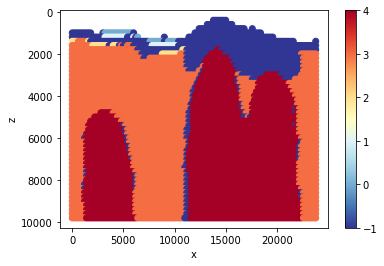

In [15]:
result_db = dbscan(data_preprocessing[:,:-2],eps=0.19,min_sample=18)
plotResult(data_noNan,result_db)

## Dimensionality Reduction

Using plot_dimensionality_reduction() to plot the cluster result after dimensionality reduction.

It has two parameters:

- The first one is dataset
- The second one is cluster result

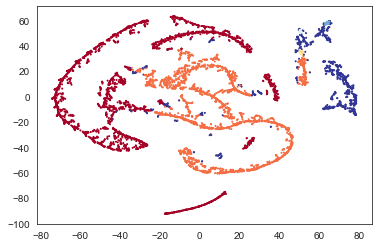

In [16]:
plot_dimensionality_reduction(data_preprocessing[:,:-2],result_db)

## Result Crossplot

crossplot_result has two parameters.
- The first one is dataset with no nan values.
- The second one is clustering result.

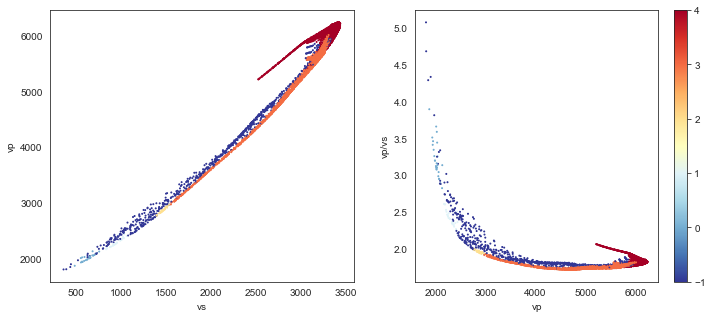

In [17]:
crossplot_result(data_noNan, result_db)

## Cluster Distribution

Using plot_cluster_distribution() to plot the distribution of clusters.

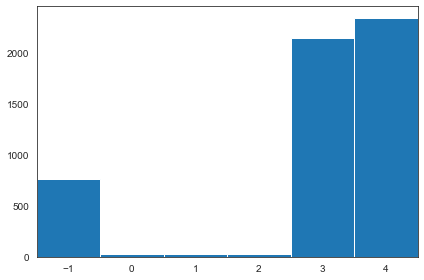

In [18]:
plot_cluster_distribution(result_db)

## Compare DBSCAN with Input Data

### Adjusted Rand Index

Using calculateAri() to calculate adjusted rand index for cluster result.

In [19]:
ari_k = calculateAri(result_db, input_label)
print("Adjusted Rand Index of DBSCAN is ", ari_k)

Adjusted Rand Index of DBSCAN is  0.6793541768973245


### Adjusted Mutual Information

Using calculateAmi() to calculate adjusted mutual information for cluster result.

In [20]:
ami_k = calculateAmi(result_db, input_label)
print("Adjusted Mutual Information of DBSCAN is ", ami_k)

Adjusted Mutual Information of DBSCAN is  0.6297700846977641


### V-measure

Using calculateVm() to calculate V-measure for two cluster results.

In [21]:
vm_k = calculateVm(result_db, input_label)
print("V-measure of DBSCAN is ", vm_k)

V-measure of DBSCAN is  0.630364345721122
